In [0]:
%reload_ext autoreload
%matplotlib inline

In [0]:
from fastai import *
from fastai.vision import *
from fastai.metrics import error_rate,accuracy
import pandas as pd

In [60]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [0]:
!mkdir Dataset

In [6]:
!unzip -I "utf-8" "/content/gdrive/My Drive/state-farm-distracted-driver-detection.zip" -d "/content/Dataset"

Archive:  /content/gdrive/My Drive/state-farm-distracted-driver-detection.zip
  inflating: /content/Dataset/sample_submission.csv  
  inflating: /content/Dataset/driver_imgs_list.csv  
  inflating: /content/Dataset/imgs.zip  


In [7]:
!mkdir "/content/Images"
!unzip -I "utf-8" "/content/Dataset/imgs.zip" -d "/content/Dataset/Images"

Archive:  /content/Dataset/imgs.zip
   creating: /content/Dataset/Images/test/
  inflating: /content/Dataset/Images/test/img_1.jpg  
  inflating: /content/Dataset/Images/test/img_10.jpg  
  inflating: /content/Dataset/Images/test/img_100.jpg  
  inflating: /content/Dataset/Images/test/img_1000.jpg  
  inflating: /content/Dataset/Images/test/img_100000.jpg  
  inflating: /content/Dataset/Images/test/img_100001.jpg  
  inflating: /content/Dataset/Images/test/img_100002.jpg  
  inflating: /content/Dataset/Images/test/img_100003.jpg  
  inflating: /content/Dataset/Images/test/img_100004.jpg  
  inflating: /content/Dataset/Images/test/img_100005.jpg  
  inflating: /content/Dataset/Images/test/img_100007.jpg  
  inflating: /content/Dataset/Images/test/img_100008.jpg  
  inflating: /content/Dataset/Images/test/img_100009.jpg  
  inflating: /content/Dataset/Images/test/img_10001.jpg  
  inflating: /content/Dataset/Images/test/img_100010.jpg  
  inflating: /content/Dataset/Images/test/img_10001

In [8]:
df = pd.read_csv("/content/Dataset/driver_imgs_list.csv")
df.head()

,subject,classname,img
0,p002,c0,img_44733.jpg
1,p002,c0,img_72999.jpg
2,p002,c0,img_25094.jpg
3,p002,c0,img_69092.jpg
4,p002,c0,img_92629.jpg


In [0]:
path = Path("/content/Dataset/Images")
train_set = Path("/content/Dataset/Images/train")
test_set = Path("/content/Dataset/Images/test")

In [0]:
dataset = (ImageList.from_folder(train_set)
                                .split_by_rand_pct(0.2)
                                .label_from_folder()
                                .transform(get_transforms(), size=256)
                                .add_test_folder(test_set)).databunch(bs=32).normalize(imagenet_stats)

In [11]:
dataset.classes

['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9']

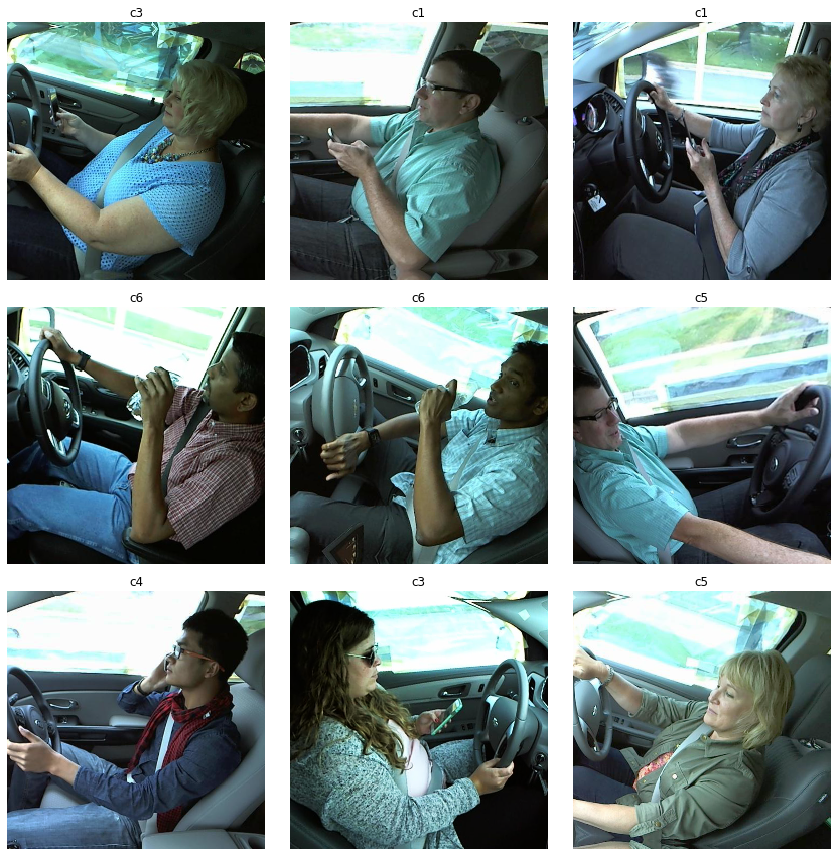

In [12]:
dataset.show_batch(3)

In [13]:
learner = cnn_learner(dataset, models.resnet34, metrics=[accuracy,error_rate])

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 144MB/s]


In [14]:
learner.fit_one_cycle(1)

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.522860,0.183870,0.949376,0.050624,06:06


In [15]:
learner.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


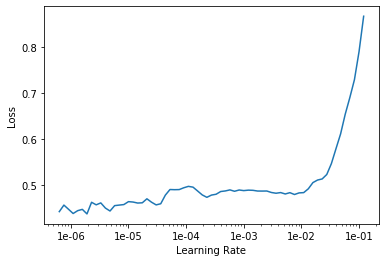

In [16]:
learner.recorder.plot()

In [17]:
learner.fit_one_cycle(8, slice(0.001))

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.407342,0.153203,0.956289,0.043711,06:02
1,0.340607,0.119626,0.962310,0.037690,06:14
2,0.262794,0.085852,0.971900,0.028100,06:12
3,0.214108,0.059360,0.980821,0.019179,06:14
4,0.207124,0.053294,0.983274,0.016726,06:13
5,0.156843,0.042435,0.986396,0.013604,06:17
6,0.134771,0.038731,0.988180,0.011820,06:19
7,0.148648,0.039382,0.987734,0.012266,06:19


In [0]:
learner.save('stage-1')

In [19]:
interp = ClassificationInterpretation.from_learner(learner)

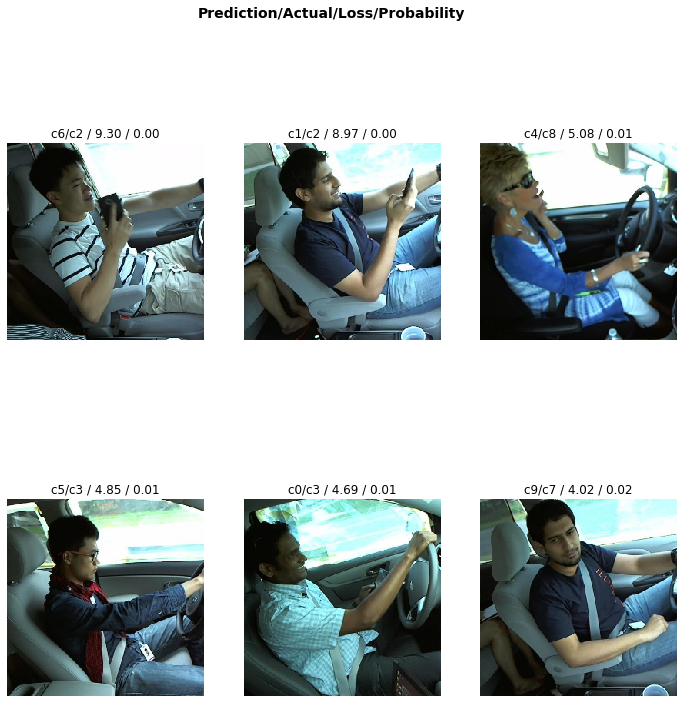

In [20]:
interp.plot_top_losses(6)

In [21]:
learner.load('stage-1')

Learner(data=ImageDataBunch;

Train: LabelList (17940 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: CategoryList
c7,c7,c7,c7,c7
Path: /content/Dataset/Images/train;

Valid: LabelList (4484 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: CategoryList
c0,c7,c8,c8,c6
Path: /content/Dataset/Images/train;

Test: LabelList (79726 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: EmptyLabelList
,,,,
Path: /content/Dataset/Images/train, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequentia

In [22]:
interp.most_confused(min_val=1)

[('c8', 'c9', 7),
 ('c0', 'c9', 5),
 ('c7', 'c9', 4),
 ('c8', 'c2', 4),
 ('c3', 'c0', 3),
 ('c4', 'c3', 3),
 ('c9', 'c0', 3),
 ('c0', 'c3', 2),
 ('c3', 'c5', 2),
 ('c8', 'c6', 2),
 ('c9', 'c8', 2),
 ('c0', 'c4', 1),
 ('c0', 'c5', 1),
 ('c0', 'c8', 1),
 ('c1', 'c0', 1),
 ('c2', 'c1', 1),
 ('c2', 'c6', 1),
 ('c3', 'c4', 1),
 ('c4', 'c0', 1),
 ('c5', 'c0', 1),
 ('c5', 'c9', 1),
 ('c6', 'c2', 1),
 ('c7', 'c2', 1),
 ('c8', 'c0', 1),
 ('c8', 'c3', 1),
 ('c8', 'c4', 1),
 ('c8', 'c7', 1),
 ('c9', 'c4', 1),
 ('c9', 'c7', 1)]

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


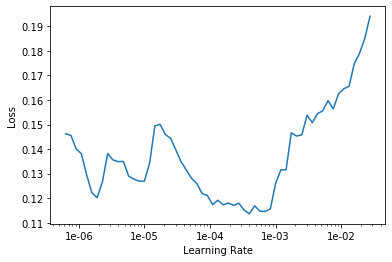

In [24]:
learner.lr_find()
learner.recorder.plot()

In [25]:
learner.fit_one_cycle(10, slice(1e-04, 1e-03))

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.132988,0.039169,0.987734,0.012266,06:14
1,0.153027,0.037382,0.988403,0.011597,05:56
2,0.161807,0.035002,0.988403,0.011597,05:53
3,0.123992,0.029183,0.992194,0.007806,05:52
4,0.118751,0.025089,0.993310,0.006690,06:11
5,0.106177,0.021496,0.993087,0.006913,06:14
6,0.080214,0.021848,0.992640,0.007360,06:19
7,0.068212,0.016580,0.995317,0.004683,06:20
8,0.058265,0.015619,0.995317,0.004683,06:25
9,0.067032,0.016183,0.994871,0.005129,06:17


In [0]:
learner.save('stage-2');

In [31]:
interp = ClassificationInterpretation.from_learner(learner)

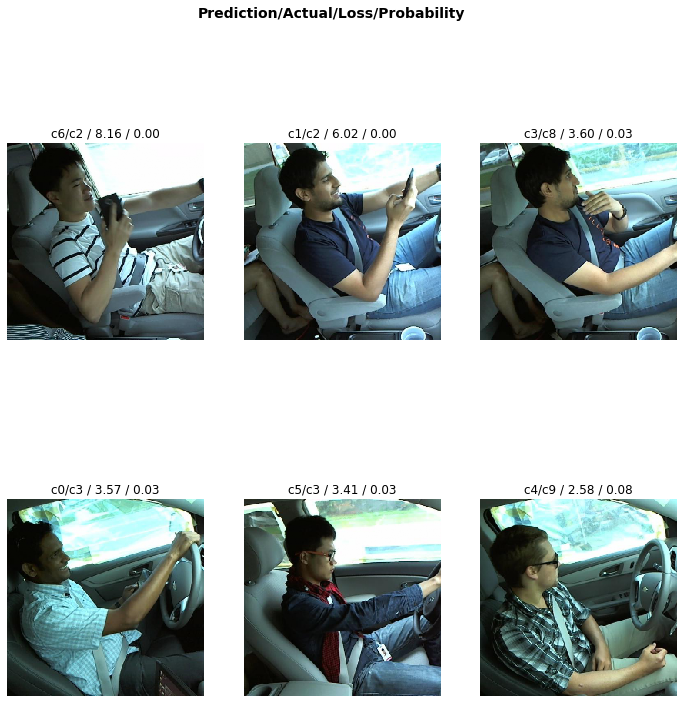

In [32]:
interp.plot_top_losses(6)

In [33]:
interp.most_confused(min_val=1)

[('c8', 'c9', 4),
 ('c0', 'c9', 2),
 ('c9', 'c0', 2),
 ('c0', 'c8', 1),
 ('c2', 'c1', 1),
 ('c2', 'c6', 1),
 ('c3', 'c0', 1),
 ('c3', 'c4', 1),
 ('c3', 'c5', 1),
 ('c4', 'c0', 1),
 ('c4', 'c3', 1),
 ('c6', 'c8', 1),
 ('c7', 'c9', 1),
 ('c8', 'c2', 1),
 ('c8', 'c3', 1),
 ('c8', 'c4', 1),
 ('c9', 'c4', 1),
 ('c9', 'c8', 1)]

drinking


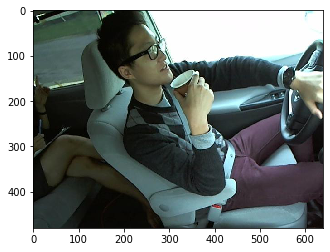

talking to passenger


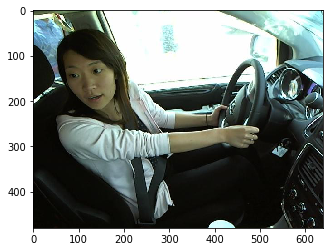

drinking


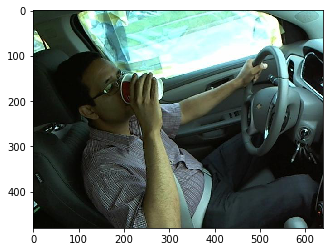

reaching behind


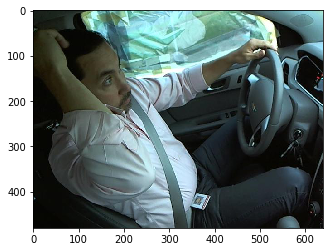

safe driving


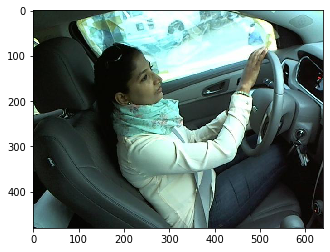

safe driving


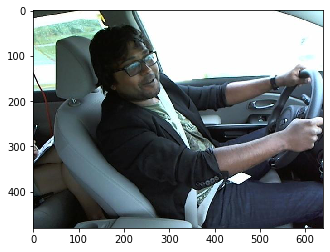

texting - right


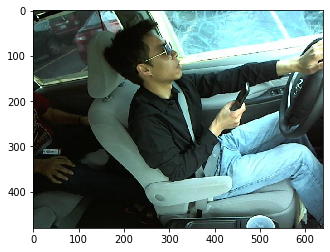

safe driving


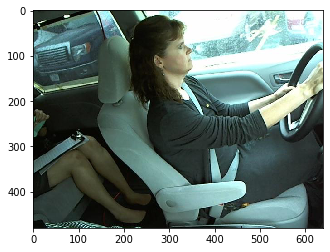

talking on the phone - left


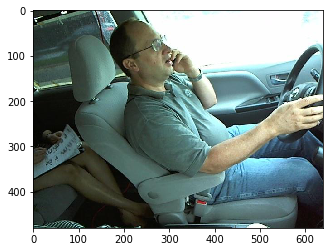

talking on the phone - left


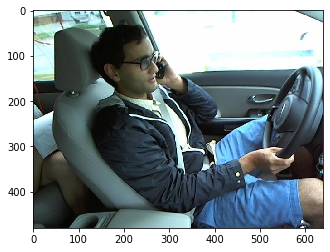

drinking


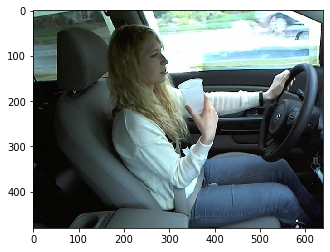

In [59]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
count=0;
Dict = {0: 'safe driving', 1: 'texting - right', 2: 'talking on the phone - right', 3: 'texting - left', 4: 'talking on the phone - left', 5: 'operating the radio', 6: 'drinking', 7: 'reaching behind', 8: 'hair and makeup', 9: 'talking to passenger'}
for dirname, _, filenames in os.walk('/content/Dataset/Images/test'):
  for filename in filenames:
    count+=1;
    img = open_image(os.path.join(dirname, filename))
    pred_class,pred_index,outputs = learner.predict(img)
    i = str(pred_class)
    print(Dict.get(int(i[1])))
    img1=mpimg.imread(os.path.join(dirname, filename))
    imgplot = plt.imshow(img1)
    plt.show()
    if(count>10):
        break